# Project 2: Mission to Mars

Double tap this cell to get to edit mode and fill in the information below.

> Full Name:

> Date:

> Resources Used:

## Tips

  * Python tutorials:
     * [A short introduction](https://realpython.com/python-first-steps/)
     * [A more complete introduction](https://www.w3schools.com/python/default.asp)
     * PythonMinimum
  * Use __esc r__ to disable a cell
  * Use __esc y__ to reactivate it
  * Use __esc m__ to go to markdown mode. **Markdown** is the typesetting language used in jupyter notebooks.
  * In a markdown cell, double tap the mouse or glide pad (on your laptop) to go to edit mode. 
  * Shift + return to execute a cell (including markdown cells).
  * If the equations don't typeset, try double tapping the cell again, and re-execute it.
  

## Learning Objectives
  * Learn how to solve Newton's second law of motion for multiple objects interacting gravitationally.
  * Learn more about programming in Python
 
**Part 1** of this notebook computes and animates the motion of the inner planets. Feel free to use any code from this section.

**Part 2** should contain your solution. 

## Introduction

A mission to Mars from the Earth requires a complicated series of calculations and a complicated series of steps [click here, for example](https://mars.nasa.gov/mer/mission/timeline/launch/launch-diagram/). But in this project, we'll ignore all of the complications and assume that at launch the probe is at the same position as the Earth and the probe's initial speed is simply the sum of the Earth's speed and the extra speed $u$ ($\Delta v$ in NASA jargon) provided by the short burn of the rocket attached to the probe.

## Project Goal

Your goal is to launch a space probe from Earth so that it arrives at Mars, by which we mean within **3 million km** of Mars. Of course, the closer you get the better!

**Assumptions**
  1. The probe starts at the same position as the Earth. 
  1. The probe is accelerated to an initial velocity, $\vec{u}$, **relative to Earth**, with $\vec{u}$ pointing in the **same direction** as Earth's velocity. 
  1. The speed $u = |\vec{u}|$ satisfies the constraint $0 \lt u \leq 6\,\text{km / s}$. As noted, the magnitude of $\vec{u}$ is referred to as $\Delta v$.
  1. After the initial burn, the mass of the space probe plus rocket is $m_p = 2 \times 10^4 \, \text{kg}$.
  1. The probe continues along an orbit under the influence of the net gravitational force of all the inner planets and the Sun. 

To solve this problem you need to:
  1. choose an initial velocity, $\vec{u}$, relative to Earth;
  1. choose when to launch the space probe;
  1. compute the orbit of the probe, and
  1. compute the **minimum distance**, $d$, between the probe and Mars.
  1. If $d < 10^5 \, \text{km}$, the probe can be considered to have arrived in the vicinity of Mars.
  1. If not, repeat the above.  

## Questions
Answer the following questions from your computations.
  1. What was your initial $\Delta v$ in km/s?
  1. How long did it take, in Earth days, for the probe to go from Earth to Mars?
  1. How far, in km, did the probe travel from Earth to Mars?
  1. When the probe gets to Mars, it adjusts its  velocity to match that of Mars. What $\Delta v$ in km/s is needed to achieve this? *Hint*: The velocity, at time $t$, of any object can be approximated as follows
  
 \begin{align}
     \vec{r}(t + h) &= \vec{r}(t) + \vec{v}(t) h + \vec{v}^{(1)}(t) h^2 + {\cal O}(h^3),\\
     \vec{r}(t - h) &= \vec{r}(t) - \vec{v}(t) h + \vec{v}^{(1)}(t) h^2 - {\cal O}(h^3),\\
     \implies \, \vec{r}(t + h) - \vec{r}(t - h) & = 2 \vec{v} h + {\cal O}(h^3),\\
     \therefore \, \vec{v}(t) & = \frac{\vec{r}(t + h) - \vec{r}(t - h)}{2 h} + {\cal O}(h^2).
 \end{align}
In words: To approximate the velocity at time $t$, subtract the previous position vector (at time $t - h$) from the next position vector (at time $t +h$) and divide by twice the time step $h$.   


### Import modules 
Make Python modules (that is, collections of programs) available to this notebook.


In [1]:
import os, sys
import numpy as np
import matplotlib as mp
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# We'll use this to read in the planetary data, which are in CSV files.
import pandas as pd

%matplotlib inline

# update fonts
FONTSIZE = 12
font = {'family' : 'sans-serif',
        'weight' : 'normal',
        'size'   : FONTSIZE}
mp.rc('font', **font)

# use latex if available on system, otherwise set usetex=False
mp.rc('text', usetex=True)

# use JavaScript for rendering animations
mp.rc('animation', html='jshtml')

# set a seed to ensure reproducibility 
# on a given machine
seed = 314159
rnd  = np.random.RandomState(seed)

### Import functions from CompPhysLab module `computil.newton`

In [2]:
from computil.newton import magnitude, norm, compute_grav_forces, plot_planet_positions, Solver,\
G, DAY, YEAR, AU2METERS, DEG2RAD, \
Msun, Mmercury, Mvenus, Mearth, Mmars

from computil.graphics import plot_central_axes

# Part 1

In [14]:
text   = ['Sun',  'Mercury', 'Venus',  'Earth', 'Mars']
masses = np.array([Msun, Mmercury, Mvenus, Mearth, Mmars])
colors = ['gold', 'magenta', 'orange', 'blue',  'red']

### `read_position_data`
This function reads the positions of planets in a heliocentric coordinate system and returns an array of five position vectors.

In [7]:
def read_position_data(filename, n=4):
    data = pd.read_csv(filename)[:n]
    data['longitude'] *= DEG2RAD

    phi    = data['longitude'].to_numpy()
    radius = data['radius'].to_numpy()

    x = radius * np.cos(phi)
    y = radius * np.sin(phi)
    z = np.zeros(len(x))

    # insert coordinates of the Sun. for simplicity assume that on 2024-09-22, the Sun 
    # is at the barycenter of the solar system.
    x = np.insert(x, 0, 0)
    y = np.insert(y, 0, 0)
    z = np.insert(z, 0, 0)
    r = np.array([x, y, z]).T
    
    return r

#### 1. Read position data of inner planets

In [11]:
# positions of inner planets and the Sun on Sep. 22 2024
r1 = read_position_data('planets1.csv')

# positions of inner planets and the Sun on Sep. 23 2024
r2 = read_position_data('planets2.csv')

r1.shape, r1, r2.shape, r2

((5, 3),
 array([[ 0.        ,  0.        ,  0.        ],
        [-0.31096328,  0.16350184,  0.        ],
        [-0.2257028 , -0.68972769,  0.        ],
        [ 1.003587  ,  0.        ,  0.        ],
        [ 0.7720094 ,  1.27648962,  0.        ]]),
 (5, 3),
 array([[ 0.        ,  0.        ,  0.        ],
        [-0.3287266 ,  0.13919658,  0.        ],
        [-0.20649479, -0.69584219,  0.        ],
        [ 1.00316445,  0.01725845,  0.        ],
        [ 0.76051766,  1.28487523,  0.        ]]))

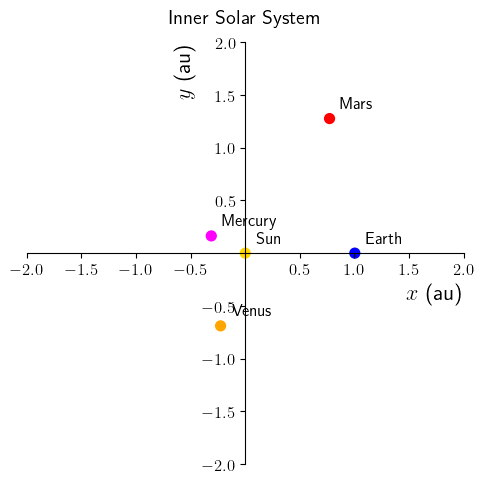

In [9]:
x = r1[:, 0]  # get 1st column
y = r1[:, 1]  # get 2nd column

plot_planet_positions(x, y, colors, text, title='Inner Solar System')

#### 2. Compute vectors in directions of motion of inner planets 

In [12]:
r21 = r2 - r1

r21.shape, r21

((5, 3),
 array([[ 0.        ,  0.        ,  0.        ],
        [-0.01776331, -0.02430525,  0.        ],
        [ 0.01920801, -0.0061145 ,  0.        ],
        [-0.00042255,  0.01725845,  0.        ],
        [-0.01149174,  0.00838561,  0.        ]]))

#### 3. Compute speeds (in m/s) of the inner planets on Sep 22 2024

In [13]:
# convert speed to m / s

speed = magnitude(r21) * AU2METERS / DAY   # speed in m / s

speed

array([    0.        , 52124.64734915, 34902.27587638, 29891.22639182,
       24631.68285515])

#### 4. Compute velocities of the inner planets on Sep 22 2024

In [18]:
# compute unit vectors in direction of motion of planets
# (for zero length vectors, return a zero vector)
u = norm(r)

# compute velocities of planets
v0 = speed[:, np.newaxis] * u

v0, v0.shape

(array([[     0.        ,      0.        ,      0.        ],
        [-30756.41759158, -42083.50791232,      0.        ],
        [ 33257.84678516, -10586.99620127,      0.        ],
        [  -731.62086099,  29882.27143513,      0.        ],
        [-19897.46415419,  14519.32231578,      0.        ]]),
 (5, 3))

#### 5. Convert positions from AU to meters

In [19]:
# convert positions from au to meters
r0 = AU2METERS * r1

r0.shape, r0

((5, 3),
 array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-4.65194538e+10,  2.44595312e+10,  0.00000000e+00],
        [-3.37646653e+10, -1.03181813e+11,  0.00000000e+00],
        [ 1.50134508e+11,  0.00000000e+00,  0.00000000e+00],
        [ 1.15490985e+11,  1.90960167e+11,  0.00000000e+00]]))

### Compute orbits of inner planets for 1000 Earth days

In [20]:
def compute_orbits(forces, m, r, v, h, days=1000):
 
    solver = Solver(forces, m, h)

    # compute number of time steps
    N = int(days * DAY / h)
    
    # compute positions at time t = 0 and t = h
    positions = [r]   # t = 0
    positions.append( solver.compute(r, v) ) # t = h
    
    # compute positions for remaining time steps
    for i in range(1, N-1):
        positions.append( solver.compute(positions[i]) )   # t = (i + 1)*H
    
    # convert positions to au
    positions = np.array(positions) / AU2METERS
    
    return positions

In [50]:
# Choose time step
h = DAY / 2

orbits = compute_orbits(compute_grav_forces, masses, r0, v0, h, days=1000)

orbits.shape, orbits[0], orbits[-1]

((2000, 5, 3),
 array([[ 0.        ,  0.        ,  0.        ],
        [-0.31096328,  0.16350184,  0.        ],
        [-0.2257028 , -0.68972769,  0.        ],
        [ 1.003587  ,  0.        ,  0.        ],
        [ 0.7720094 ,  1.27648962,  0.        ]]),
 array([[ 4.23610087e-05,  3.59278212e-05,  0.00000000e+00],
        [ 3.62364331e-01, -2.33385269e-02,  0.00000000e+00],
        [ 4.10014692e-01,  5.90846363e-01,  0.00000000e+00],
        [-4.08572176e-01, -9.58131214e-01,  0.00000000e+00],
        [-1.45136735e+00, -6.85984420e-01,  0.00000000e+00]]))

### Animate solution

In [61]:
class InnerSolarSystem:
    '''
    Example
    
    fday = h / DAY
    anim = InnerSolarSystem(data, fday, colors)
    anim.show()
    
    '''
    
    # constructor.
    # this function, which is always called __init__(...), creates and initializes 
    # an object of this class
    
    def __init__(self, data, colors, days, 
                 daysframe=4,   # days / frame
                 interval=125,  # time between frames in milliseconds
                 xmin=-2, xmax=2, ymin=-2, ymax=2,
                 fgsize=(5, 5), 
                 ftsize=16):
        '''
        
        Parameters
        ----------
        data     : array of shape (N, n, 3)
                N = number of time steps
                n = number of objects
                3 = x, y, z components of position vectors
                
        colors   : list of strings  
                colors of planets  
                
        days     : float
                simulation time step in days
                
        daysframe: int (4)
                days / frame
                
        interval : int (125)
                time between frames in milliseconds
        '''
        
        # cache inputs
        self.data   = data
        self.colors = colors
        self.days   = days
        self.daysframe = daysframe
        self.interval  = interval
        
        # compute number of frames
        self.factor = daysframe / days
        self.nframes= int(len(data) / self.factor)
        
        # set size of figure
        fig = plt.figure(figsize=fgsize)
        
        self.fig = fig # cache figure
        
        # create area for a plot 
        nrows, ncols, index = 1, 1, 1
        ax  = plt.subplot(nrows, ncols, index)
        
        self.ax = ax   # cache plot
        
        ax.set_title('Inner Solar System', pad=14)

        # place axes at the center of the plot
        nxticks = nyticks = 9
        xlabel  = '$x$ (au)'
        ylabel  = '$y$ (au)'
        plot_central_axes(ax, 
                          xmin, xmax, nxticks, xlabel,
                          ymin, ymax, nyticks, ylabel, 
                          ftsize)
        
        # create a scatter plot to represent the planets
        x = data[0, :, 0] # initial x positions of solar system objects
        y = data[0, :, 1] # initial y positions of solar system objects
        self.scatter = ax.scatter(x, y, s=50, c=colors)

        # matplotlib refers to the objects scatter, plot, text, etc. as artists.
        # we need to place artists in a list since we need to return all of
        # them in the function update() for the animation to work correctly
        self.artists = []
        self.artists.append(self.scatter)
        
        # create a line plot for each orbit
        self.plot = []
        for c in colors:
            self.plot.append(ax.plot([], [], color=c)[0])
            self.artists.append(self.plot[-1])

        # IMPORTANT: Turn off Latex processing of text; it is far too slow!
        mp.rc('text', usetex=False)

        # create a text object to display the days since the start
        self.text = ax.text(0.5, -1.8, 'Day: {0:4d}')
        self.artists.append(self.text)
        
        # fix the layout so that labels are a bit
        # closer to the plot
        fig.tight_layout()
        
        # don't show the above plots. Show only the animated version
        plt.close()

        # initialize animated plot
        self.ani = FuncAnimation(fig=fig,                # animation figure
                                 func=self.update,       # function to update plot in figure
                                 repeat=False,           # don't repeat animation
                                 frames=self.nframes,    # number of frames
                                 interval=self.interval) # time between frames (ms)

    # this is the function that updates the plot    
    def update(self, frame):
        
        if frame % 10 == 0:
            print(f'\rframe: {frame:d}', end='')
        
        # get artists!
        data, plot, scatter, text = self.data, self.plot, self.scatter, self.text
        
        # compute index into first axis of position array
        index = int(frame * self.factor)
        
        # compute number of Earth days since the start
        day = int(index * self.days)
        
        # display the number of days
        self.text.set_text(f'Day: {day:4d}')
        
        # display the current position of planets
        x = data[index, :, 0]
        y = data[index, :, 1]
        a = np.array([x, y]).T   # we need x and y to be columns
        scatter.set_offsets(a)
        
        # each column corresponds to a different data set
        # plot orbits up to index
        xx = data[:index, :, 0].T
        yy = data[:index, :, 1].T
        for i, (x, y) in enumerate(zip(xx, yy)):
            plot[i].set_data(x, y)

        # must return artists for animation to work
        return self.artists
    
    def show(self):
        plt.show()
        return self.ani
    
    def save(self, filename):
        self.ani.save(filename)

In [62]:
solar = InnerSolarSystem(orbits, colors, days=h/DAY)
solar.show()

frame: 240

# Part 2

## Questions
Answer the following questions from your computations.
  1. What was your initial $\Delta v$ in km/s?
  1. How long did it take, in Earth days, for the probe to go from Earth to Mars?
  1. How far, in km, did the probe travel from Earth to Mars?
  1. When the probe gets to Mars, it adjusts its  velocity to match that of Mars. What $\Delta v$ in km/s is needed to achieve this?

### I. Get the orbits of Earth and Mars
  1. Convert `orbits` from au to meters (but assign a different name, e.g., `Orbits`, to the converted array).
  1. For convenience, extract the orbits of Earth and Mars from `Orbits`.

### II. Complete the function below.

In your comments, give the shape of each array.

  1. `g` is the net gravitational field at the probe due to all the inner solar system objects.
  1. `fnet` is the corresponding net gravitational force on the probe.
  
*Hint*: Look at `compute_grav_forces` in `computil.newton`.

In [107]:
def compute_force_on_probe(m, r, m_probe, r_probe):
    # What are the shapes of the input arrays?

    
    # 1. compute all vectors R from inner solar system objects to the probe
    #    Hint: this is a one-liner!

    
    # 2. compute magnitudes of the array of vectors R

    
    # 3. one of these magnitudes is zero. Use 
    #
    # mag = np.where(condition on magnitudes, value if condition True, value if condition False)
    #
    #    to protect against zero distances

    
    # 4. change shape of magnitudes array and assign reshaped array to variable "distance"

    
    # 5. change shape of m array and assign reshaped array to variable "mass"


    # 6. compute all gravitational fields at the position of the probe

    
    # compute net gravitational field at probe by summing the fields along axis 0, 
    # that is, "vertically".

    
    # compute the net force on the probe 

    
    return fnet

### III. Solve the Initial Value Problem with `solve_ivp`

`solve_ivp` is a `scipy` function for solving a set of 1st order ordinary differential equations (ODE), such as Newton's second law,

$$\vec{F} = m \vec{a},$$ 

for a particle of mass $m$, which as we've noted can be written as two 1st-order ODEs

\begin{align}
    \frac{d\vec{r}}{dt} & = \vec{v}, \\
    \frac{d\vec{v}}{dt} & = \frac{1}{m} \vec{F} .
\end{align}

To use `solve_ivp` we must split the vector equations into their $x$ and $y$ components as follows,

\begin{align}
    \frac{dx}{dt} & = v_x, \\
    \frac{dy}{dt} & = v_y, \\
    \frac{dv_x}{dt} & = \frac{1}{m} F_x, \\
    \frac{dv_y}{dt} & = \frac{1}{m} F_y .
\end{align}

The `scipy` solver is called as follows,

```python
soln = solve_ivp(F, tspan, f0, 
                 method='DOP853',
                 t_eval=teval, args=(M, Orbits, m_probe, r_probe, h))
```

where

  1. `F(t, f)` is the set of equations to be solved, where `t` is the time, `f` is an array of variables (the components of $\vec{r}$ and $\vec{v}$);
  1. `tspan = (start, end)` is the time span over which to find the solution;
  1. `f0` is an array of initial values of `f`;
  1. `method` is the solution method;
  1. `t_eval` is an array giving the time stamps at which to return the solutions, and
  1. `args` is a tuple of arguments to be appended to the arguments of `F`.
  
`args`
  1. `M` is an array of masses (of the Sun and the inner planets)
  1. `Orbits` is an array of shape (N, 5, 3) of solar and planetary positions in meters, where N is the number of time steps.
  1. `m_probe` is the mass of the probe after it has expended fuel to achieve the desired $\Delta v$
  1. `r_probe` a 3-vector that is initially zero
  1. `h` is the time step size.

#### Setup `tspan`, `teval`

In [65]:
days  = 900                   # duration of simulation of probe
nsteps= int(days * DAY / h)   # number of time steps

t_start = 0
t_end = nsteps * h
tspan = (t_start, t_end)      # see description above
teval = np.linspace(t_start, t_end, nsteps+1)

m_probe = 2e4 # kg            # mass of probe (kg) after burn
r_probe = np.zeros(3)         # this will be position of the probe

In [66]:
from scipy.integrate import solve_ivp

# function to be integrated
def F(t, f, m, orbits, mp, rp, h):
    
    # position of probe
    x  = f[0]   
    y  = f[1]
    
    # velocity of probe
    vx = f[2]
    vy = f[3]
    
    # get current positions of the sun and the planets 
    n  = int(t/h)
    r  = orbits[n]  # shape: (5, 3)
    
    # the z component is always zero
    rp[0] = x
    rp[1] = y
    
    fx, fy, _  = compute_force_on_probe(m, r, mp, rp)

    # differential equations to solve
    dxdt  = vx
    dydt  = vy
    
    dvxdt = fx / mp
    dvydt = fy / mp

    return np.array([dxdt, dydt, dvxdt, dvydt])

#### `set_initial values`

In [70]:
def set_initial_values(J, earth, deltav, h):
    
    earth_position = earth[J]
    earth_velocity =(earth[J+1] - earth[J-1])/h/2    # approximate velocity (O(h^2))

    earth_speed    = magnitude(earth_velocity)
    earth_unit     = norm(earth_velocity)            # unit vector in direction of Earth's motion

    # choose Deltav
    probe_speed = earth_speed + deltav

    vp0 = probe_speed * earth_unit                   # initial probe velocity
    rp0 = earth_position                             # initial probe position

    # place initial values in into array f0 for solve_ivp
    x0,  y0,  _ = rp0
    vx0, vy0, _ = vp0
    f0 = np.array([x0, y0, vx0, vy0])
    return f0

#### `compute_orbit_of_probe`

In [100]:
def compute_orbit_of_probe(F, f0, tspan, teval, m, r, mp, rp, h):
    soln = solve_ivp(F, tspan, f0, 
                     method='DOP853',
                     t_eval=teval, args=(m, r, mp, rp, h))

    x, y, vx, vy = soln.y

    # create 2-vectors from the components
    rp = np.array([x, y, np.zeros(len(x))]).T
    vp = np.array([vx, vy, np.zeros(len(vx))]).T
    return rp, vp

Your task is to find a time index `J`, corresponding to a certain number of half-days from the start, and a `deltav` such that the distance of closest approach of the probe to Mars is less than 100,000 km.

  1. Choose a time index `J`.
  1. Choose `deltav`.
  1. Compute probe orbit.
  1. Compute distance $d$ of closest approach of the probe to Mars.
  1. If $d < 10^5 \, \text{km}$ the probe has arrived at Mars, otherwise repeat 1 to 4.

### Answers to questions

### IV. Animate solution

Use the the class `InnerSolarSystem` to animate the inner Solar System objects and your probe. Note: This class requires that all objects in the simulation are simulated for the same duration.
  1. Start the animation when the probe is launched.
  1. End the animation when the simulation of the probe ends.